# Visualize lesions for patient 11-37493

Builds on `notebooks/explore.ipynb` and `scripts/closest_anatomy.py`. Reuses the CT NIfTI,
TotalSegmentator organ segmentation, and `closest_anatomy.csv` already produced in
`outputs/11-37493/`.

In [1]:
import sys
from pathlib import Path

import numpy as np
import pandas as pd
import SimpleITK as sitk
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy import ndimage
from skimage.measure import marching_cubes
from rt_utils import RTStructBuilder, image_helper

sys.path.append(str(Path('..').resolve()))
from scripts.closest_anatomy import (
    find_patient_series_dirs,
    pick_rtstruct_reference_series,
    get_lesion_roi_names,
    sitk_affine,
)
from totalsegmentator.map_to_binary import class_map

In [2]:
patient_dir = Path('../data/11-37493')
output_dir = Path('../outputs/11-37493')

ct_dir, pt_dir, rtstruct_file = find_patient_series_dirs(patient_dir)
reference_series_dir = pick_rtstruct_reference_series(rtstruct_file, ct_dir, pt_dir)

ct_nifti_path = output_dir / 'ct.nii.gz'
seg_nifti_path = output_dir / 'segmentation_total.nii.gz'
csv_path = output_dir / 'closest_anatomy.csv'

print('CT dir:', ct_dir)
print('PET dir:', pt_dir)
print('RTSTRUCT contoured against:', reference_series_dir)
print('CT NIfTI:', ct_nifti_path, ct_nifti_path.exists())
print('Segmentation:', seg_nifti_path, seg_nifti_path.exists())
print('closest_anatomy.csv:', csv_path, csv_path.exists())

CT dir: ..\data\11-37493\11-37493_11-37493_CT_2011-12-15_112426_._CT.WB.50cm_n263__00000
PET dir: ..\data\11-37493\11-37493_11-37493_PT_2011-12-15_112426_._PET.HD.AC_n263__00000
RTSTRUCT contoured against: ..\data\11-37493\11-37493_11-37493_PT_2011-12-15_112426_._PET.HD.AC_n263__00000
CT NIfTI: ..\outputs\11-37493\ct.nii.gz True
Segmentation: ..\outputs\11-37493\segmentation_total.nii.gz True
closest_anatomy.csv: ..\outputs\11-37493\closest_anatomy.csv True


In [3]:
ct_image = sitk.ReadImage(str(ct_nifti_path))
seg_image = sitk.ReadImage(str(seg_nifti_path))

# keep everything in (x, y, z) index order matching ct_image.GetSize() / ct_affine
ct_arr = np.transpose(sitk.GetArrayFromImage(ct_image), (2, 1, 0))
seg_arr = np.transpose(sitk.GetArrayFromImage(seg_image), (2, 1, 0))
ct_affine = sitk_affine(ct_image)
ct_spacing = ct_image.GetSpacing()
ct_size = ct_image.GetSize()

class_names = class_map['total']
name_to_label = {name: label for label, name in class_names.items()}

closest_df = pd.read_csv(csv_path)

rtstruct = RTStructBuilder.create_from(
    dicom_series_path=str(reference_series_dir), rt_struct_path=str(rtstruct_file)
)
pixel_to_patient = image_helper.get_pixel_to_patient_transformation_matrix(rtstruct.series_data)
lesion_names = get_lesion_roi_names(rtstruct, r'suv\s*peak\s*sphere')

print('CT array shape (x,y,z):', ct_arr.shape)
print('Segmentation array shape (x,y,z):', seg_arr.shape)
print('Number of lesions:', len(lesion_names))
closest_df.head()

CT array shape (x,y,z): (512, 512, 263)
Segmentation array shape (x,y,z): (512, 512, 263)
Number of lesions: 34


,lesion,closest_anatomy,distance_mm,overlap_fraction,n_voxels,n_voxels_out_of_ct_fov,centroid_xyz_mm
0,ROI-1,iliac_vena_left,73.816650,0.644737,76,0,"[13.384027998698386, -138.97342482052352, -793..."
1,ROI-2,small_bowel,0.000000,1.000000,50,0,"[1.3124822092056274, -132.34376487731933, -620..."
2,ROI-3,vertebrae_L5,0.000000,0.906977,43,0,"[-8.012372238691462, 8.097123534180398, -607.1..."
3,ROI-4,vertebrae_L5,0.000000,1.000000,8,0,"[3.6458154916763306, -3.6458510160446167, -605..."
4,ROI-5,autochthon_right,6.176321,0.980159,252,0,"[-13.99017949425985, 62.61572161364177, -175.1..."


## SUV computation

PET pixel data is stored as activity concentration (`Units=BQML`, `RescaleSlope`/`RescaleIntercept`). Convert to SUVbw using patient weight and decay-corrected injected dose, following the standard formula. The resulting SUV volume is built directly from `rtstruct.series_data` (the same slice list/order rt-utils used to build the lesion masks), so it is voxel-aligned with the lesion masks with no extra resampling.

In [4]:
def dicom_time_to_seconds(time_str: str) -> float:
    time_str = str(time_str).split('.')[0]
    return int(time_str[0:2]) * 3600 + int(time_str[2:4]) * 60 + int(time_str[4:6])


def build_suv_volume(series_data) -> np.ndarray:
    """SUVbw volume in the same (Columns, Rows, slices) = (x, y, z) layout rt-utils masks use."""
    first = series_data[0]
    assert first.Units == 'BQML', f"Unexpected PET Units: {first.Units}"

    weight_g = float(first.PatientWeight) * 1000
    rp = first.RadiopharmaceuticalInformationSequence[0]
    injected_dose_bq = float(rp.RadionuclideTotalDose)
    half_life_s = float(rp.RadionuclideHalfLife)
    injection_s = dicom_time_to_seconds(rp.RadiopharmaceuticalStartTime)
    reference_s = dicom_time_to_seconds(first.SeriesTime)
    decay_s = reference_s - injection_s
    if decay_s < 0:
        decay_s += 24 * 3600
    decayed_dose_bq = injected_dose_bq * (0.5 ** (decay_s / half_life_s))

    slices = []
    for s in series_data:
        raw = s.pixel_array.T.astype(np.float64)  # -> (Columns, Rows) = (x, y)
        slope = float(getattr(s, 'RescaleSlope', 1.0))
        intercept = float(getattr(s, 'RescaleIntercept', 0.0))
        slices.append(raw * slope + intercept)  # Bq/mL
    activity_bqml = np.stack(slices, axis=-1)  # (x, y, z)

    return activity_bqml * weight_g / decayed_dose_bq


suv_volume = build_suv_volume(rtstruct.series_data)
print('SUV volume shape:', suv_volume.shape)
print('SUV min/mean/max:', suv_volume.min(), suv_volume.mean(), suv_volume.max())

SUV volume shape: (192, 192, 263)
SUV min/mean/max: 0.0 0.18356149670932329 58.899046962677005


In [5]:
# PET voxel volume, from the same transformation matrix used to build the masks
pet_voxel_volume_mm3 = (
    np.linalg.norm(pixel_to_patient[:3, 0])
    * np.linalg.norm(pixel_to_patient[:3, 1])
    * np.linalg.norm(pixel_to_patient[:3, 2])
)

lesion_stats = []
lesion_masks = {}
for name in lesion_names:
    mask = rtstruct.get_roi_mask_by_name(name)
    lesion_masks[name] = mask
    lesion_stats.append({
        'lesion': name,
        'n_voxels_pet': int(mask.sum()),
        'volume_mm3': float(mask.sum()) * pet_voxel_volume_mm3,
        'suv_max': float(suv_volume[mask].max()),
        'suv_mean': float(suv_volume[mask].mean()),
    })

lesion_stats_df = pd.DataFrame(lesion_stats)
lesions_df = lesion_stats_df.merge(closest_df, on='lesion', how='left')
lesions_df.sort_values('volume_mm3', ascending=False).head()

,lesion,n_voxels_pet,volume_mm3,suv_max,suv_mean,closest_anatomy,distance_mm,overlap_fraction,n_voxels,n_voxels_out_of_ct_fov,centroid_xyz_mm
20,ROI-21,695,30208.291016,19.317091,5.827049,vertebrae_L1,0.000000,0.310791,695,0,"[-13.043707525815895, -7.320536187741396, -481..."
21,ROI-22,406,17646.857422,6.685406,2.599355,kidney_right,0.000000,0.879310,406,0,"[-38.020850266729084, 7.722683218899618, -462...."
4,ROI-5,252,10953.222656,0.891489,0.545652,autochthon_right,6.176321,0.980159,252,0,"[-13.99017949425985, 62.61572161364177, -175.1..."
16,ROI-17,190,8258.381836,1.439788,0.936182,autochthon_right,0.000000,0.842105,190,0,"[-37.053196779050324, 40.084959434208116, -584..."
24,ROI-25,155,6737.101074,4.595916,2.569297,kidney_right,0.000000,0.974194,155,0,"[-61.14416965515383, -5.539332157565702, -474...."


In [6]:
largest_row = lesions_df.loc[lesions_df['volume_mm3'].idxmax()]
hottest_row = lesions_df.loc[lesions_df['suv_max'].idxmax()]

largest_name, hottest_name = largest_row['lesion'], hottest_row['lesion']

print(f"Largest lesion:  {largest_name}  (volume={largest_row['volume_mm3']:.1f} mm^3, "
      f"SUVmax={largest_row['suv_max']:.2f}, closest anatomy={largest_row['closest_anatomy']})")
print(f"Hottest lesion:  {hottest_name}  (SUVmax={hottest_row['suv_max']:.2f}, "
      f"volume={hottest_row['volume_mm3']:.1f} mm^3, closest anatomy={hottest_row['closest_anatomy']}, "
      f"distance={hottest_row['distance_mm']:.2f} mm)")

Largest lesion:  ROI-21  (volume=30208.3 mm^3, SUVmax=19.32, closest anatomy=vertebrae_L1)
Hottest lesion:  ROI-21  (SUVmax=19.32, volume=30208.3 mm^3, closest anatomy=vertebrae_L1, distance=0.00 mm)


## Resampling PET-space volumes onto the CT grid

The lesion masks and the SUV volume live on the coarse PET grid (192x192x263, ~3.6mm in-plane).
The CT and TotalSegmentator segmentation share a common fine grid (512x512x263, ~0.98mm in-plane).
For visualization, resample the PET-space arrays onto the CT grid using the *same* physical
transform rt-utils used to build the masks (`pixel_to_patient`), so everything lines up exactly.

In [7]:
def pet_space_to_sitk_image(array_xyz: np.ndarray, pixel_to_patient: np.ndarray) -> sitk.Image:
    """Wrap a (x, y, z) array (rt-utils layout) into a geometrically correct sitk.Image."""
    origin = pixel_to_patient[:3, 3].astype(np.float64)
    cols = [pixel_to_patient[:3, i].astype(np.float64) for i in range(3)]
    spacing = tuple(float(np.linalg.norm(c)) for c in cols)
    direction = np.column_stack([c / s for c, s in zip(cols, spacing)])

    array_numeric = array_xyz.astype(np.uint8) if array_xyz.dtype == bool else array_xyz
    img = sitk.GetImageFromArray(np.transpose(array_numeric, (2, 1, 0)))
    img.SetOrigin(tuple(float(v) for v in origin))
    img.SetSpacing(spacing)
    img.SetDirection(tuple(float(v) for v in direction.flatten()))
    return img


def resample_to_ct(array_xyz: np.ndarray, pixel_to_patient: np.ndarray, is_mask: bool) -> np.ndarray:
    src_img = pet_space_to_sitk_image(array_xyz, pixel_to_patient)
    if is_mask:
        src_img = sitk.Cast(src_img, sitk.sitkUInt8)
        interpolator, out_type, default = sitk.sitkNearestNeighbor, sitk.sitkUInt8, 0
    else:
        src_img = sitk.Cast(src_img, sitk.sitkFloat32)
        interpolator, out_type, default = sitk.sitkLinear, sitk.sitkFloat32, 0.0

    resampled = sitk.Resample(src_img, ct_image, sitk.Transform(), interpolator, default, out_type)
    return np.transpose(sitk.GetArrayFromImage(resampled), (2, 1, 0))


suv_ct = resample_to_ct(suv_volume, pixel_to_patient, is_mask=False)
print('SUV resampled to CT grid, shape:', suv_ct.shape, 'max:', suv_ct.max())

SUV resampled to CT grid, shape: (512, 512, 263) max: 58.32846


## 3D mesh + MIP helpers

`mesh_from_volume` runs marching cubes on the full CT/SUV volume (used for the translucent
body-surface and PET "hot region" context surfaces). `mesh_from_local_mask` crops to the
mask's bounding box first, so small lesions/organs still get a full-resolution mesh cheaply.
`plot_3d_scene` assembles any combination of these into one interactive plotly figure, all in
physical mm so everything lines up. `mip_triplet` renders axial/coronal/sagittal maximum
intensity projections with mask footprints (contours) overlaid.

In [8]:
def voxel_to_physical(verts_ijk: np.ndarray, affine: np.ndarray) -> np.ndarray:
    homogeneous = np.concatenate([verts_ijk, np.ones((len(verts_ijk), 1))], axis=1)
    return (affine @ homogeneous.T).T[:, :3]


def mesh_from_volume(volume_xyz: np.ndarray, level: float, affine: np.ndarray, step_size: int = 2):
    """Marching cubes over the whole array. For large context surfaces (CT body, PET hot region)."""
    verts_ijk, faces, _, _ = marching_cubes(volume_xyz, level=level, step_size=step_size)
    return voxel_to_physical(verts_ijk, affine), faces


def mesh_from_local_mask(mask_xyz: np.ndarray, affine: np.ndarray, padding: int = 3):
    """Marching cubes cropped to the mask's bounding box, at full resolution. Returns None if empty/too small."""
    coords = np.argwhere(mask_xyz)
    if len(coords) == 0:
        return None
    lo = np.maximum(coords.min(axis=0) - padding, 0)
    hi = np.minimum(coords.max(axis=0) + padding + 1, np.array(mask_xyz.shape))
    crop = mask_xyz[lo[0]:hi[0], lo[1]:hi[1], lo[2]:hi[2]].astype(np.float32)

    if crop.shape[0] < 2 or crop.shape[1] < 2 or crop.shape[2] < 2 or crop.max() == crop.min():
        return None

    try:
        verts_ijk, faces, _, _ = marching_cubes(crop, level=0.5)
    except (ValueError, RuntimeError):
        return None
    verts_ijk = verts_ijk + lo
    return voxel_to_physical(verts_ijk, affine), faces


def mesh_trace(mesh, color: str, opacity: float, name: str):
    verts, faces = mesh
    return go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        color=color, opacity=opacity, name=name, showlegend=True,
    )


def plot_3d_scene(title, body_mesh=None, pet_mesh=None, highlights=None):
    """highlights: list of (mesh, color, name, centroid_mm) to render solid + annotate."""
    traces = []
    if body_mesh is not None:
        traces.append(mesh_trace(body_mesh, 'lightgray', 0.12, 'CT body surface'))
    if pet_mesh is not None:
        traces.append(mesh_trace(pet_mesh, 'orange', 0.35, 'PET hot region (SUV>=2.5)'))

    annotation_points = {'x': [], 'y': [], 'z': [], 'text': []}
    for mesh, color, name, centroid_mm in (highlights or []):
        if mesh is None:
            print(f"  [warn] could not build mesh for {name}, skipping")
            continue
        traces.append(mesh_trace(mesh, color, 0.85, name))
        annotation_points['x'].append(centroid_mm[0])
        annotation_points['y'].append(centroid_mm[1])
        annotation_points['z'].append(centroid_mm[2])
        annotation_points['text'].append(name)

    if annotation_points['x']:
        traces.append(go.Scatter3d(
            x=annotation_points['x'], y=annotation_points['y'], z=annotation_points['z'],
            mode='markers+text', text=annotation_points['text'], textposition='top center',
            marker=dict(size=3, color='black'), name='labels', showlegend=False,
        ))

    fig = go.Figure(data=traces)
    fig.update_layout(
        title=title,
        scene=dict(aspectmode='data', xaxis_title='x (mm)', yaxis_title='y (mm)', zaxis_title='z (mm)'),
        width=900, height=700, legend=dict(itemsizing='constant'),
    )
    return fig

In [9]:
# Precompute the shared context surfaces once (CT body outline, PET "hot" region) so every
# 3D plot below reuses them instead of re-running marching cubes on the full volume each time.
#
# marching_cubes assumes isotropic array steps; running it directly on the native CT grid
# (~0.98mm in-plane but ~3.27mm slice spacing) with a coarse step_size produces aliased
# surfaces because the stride skips much further in z than in x/y. Resample onto a coarse
# isotropic grid first (these are translucent context surfaces, not the analytical result, so
# 7mm is plenty) so a single step_size is valid in every direction.
#
# A simple -300 HU threshold also picks up the CT table the patient is lying on, which shows
# up edge-on in the 3D view as thin vertical fringes. The table is a separate, disconnected
# blob from the body in 3D, so keeping only the largest connected component removes it.

def make_isotropic_reference(image: sitk.Image, spacing_mm: float) -> sitk.Image:
    orig_spacing = np.array(image.GetSpacing())
    orig_size = np.array(image.GetSize())
    new_size = tuple(int(round(s)) for s in orig_size * orig_spacing / spacing_mm)
    ref = sitk.Image(new_size, sitk.sitkFloat32)
    ref.SetOrigin(image.GetOrigin())
    ref.SetSpacing((spacing_mm, spacing_mm, spacing_mm))
    ref.SetDirection(image.GetDirection())
    return ref


def largest_connected_component(mask: np.ndarray) -> np.ndarray:
    labels, n = ndimage.label(mask)
    sizes = ndimage.sum(mask, labels, range(1, n + 1))
    return labels == (np.argmax(sizes) + 1)


iso_ref = make_isotropic_reference(ct_image, spacing_mm=7.0)
iso_affine = sitk_affine(iso_ref)

ct_iso_img = sitk.Resample(ct_image, iso_ref, sitk.Transform(), sitk.sitkLinear, -1000.0, sitk.sitkFloat32)
ct_iso_arr = np.transpose(sitk.GetArrayFromImage(ct_iso_img), (2, 1, 0))
body_only_mask = largest_connected_component(ct_iso_arr > -300).astype(np.float32)

suv_pet_img = sitk.Cast(pet_space_to_sitk_image(suv_volume, pixel_to_patient), sitk.sitkFloat32)
suv_iso_img = sitk.Resample(suv_pet_img, iso_ref, sitk.Transform(), sitk.sitkLinear, 0.0, sitk.sitkFloat32)
suv_iso_arr = np.transpose(sitk.GetArrayFromImage(suv_iso_img), (2, 1, 0))

body_mesh = mesh_from_volume(body_only_mask, level=0.5, affine=iso_affine, step_size=1)
pet_hot_mesh = mesh_from_volume(suv_iso_arr, level=2.5, affine=iso_affine, step_size=1)
print('body mesh verts:', len(body_mesh[0]), '| PET hot mesh verts:', len(pet_hot_mesh[0]))

body mesh verts: 41326 | PET hot mesh verts: 16297


## 1. Largest lesion — 3D, annotated, overlaid on PET/CT

In [10]:
def lesion_centroid_mm(name: str) -> np.ndarray:
    voxel_idx = np.argwhere(lesion_masks[name]).astype(float)
    physical_pts = image_helper.apply_transformation_to_3d_points(voxel_idx, pixel_to_patient)
    return physical_pts.mean(axis=0)


largest_mask_ct = resample_to_ct(lesion_masks[largest_name], pixel_to_patient, is_mask=True).astype(bool)
largest_mesh = mesh_from_local_mask(largest_mask_ct, ct_affine)

fig = plot_3d_scene(
    title=f"Largest lesion: {largest_name} (volume={largest_row['volume_mm3']:.0f} mm³, SUVmax={largest_row['suv_max']:.1f})",
    body_mesh=body_mesh,
    pet_mesh=pet_hot_mesh,
    highlights=[(largest_mesh, 'red', largest_name, lesion_centroid_mm(largest_name))],
)
fig.show()

## 2. Hottest lesion (highest SUVmax) — 3D, annotated, overlaid on PET/CT

In [11]:
if hottest_name == largest_name:
    print(f"Hottest lesion is the same as the largest lesion ({hottest_name}); reusing its mesh.")
    hottest_mask_ct, hottest_mesh = largest_mask_ct, largest_mesh
else:
    hottest_mask_ct = resample_to_ct(lesion_masks[hottest_name], pixel_to_patient, is_mask=True).astype(bool)
    hottest_mesh = mesh_from_local_mask(hottest_mask_ct, ct_affine)

fig = plot_3d_scene(
    title=f"Hottest lesion: {hottest_name} (SUVmax={hottest_row['suv_max']:.1f}, volume={hottest_row['volume_mm3']:.0f} mm³)",
    body_mesh=body_mesh,
    pet_mesh=pet_hot_mesh,
    highlights=[(hottest_mesh, 'crimson', hottest_name, lesion_centroid_mm(hottest_name))],
)
fig.show()

Hottest lesion is the same as the largest lesion (ROI-21); reusing its mesh.


## 3. Hottest lesion — 2D maximum intensity projections (axial / coronal / sagittal)

MIPs are computed on the CT-grid-resampled SUV volume (finer resolution than native PET,
nicer-looking) with the lesion's projected footprint outlined.

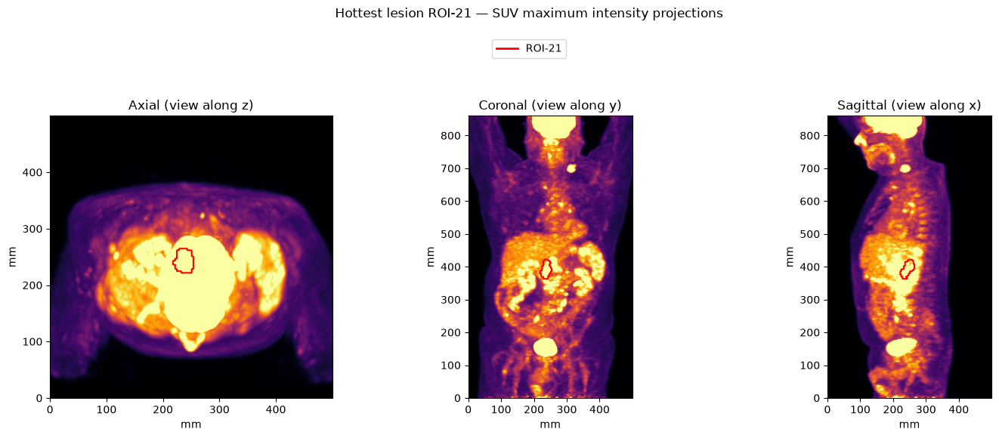

In [12]:
def mip_triplet(volume_xyz, spacing_xyz, masks=None, title='', cmap='inferno', vmax_percentile=99.5):
    """3-panel axial/coronal/sagittal maximum intensity projection with mask footprint overlays.

    masks: optional dict of {label: (boolean_mask_xyz, color)}; footprints are outlined via contour.
    """
    masks = masks or {}
    sx, sy, sz = spacing_xyz
    nx, ny, nz = volume_xyz.shape
    vmax = np.percentile(volume_xyz, vmax_percentile)

    # (plane name, axis projected away, (n_u, n_v), (spacing_u, spacing_v), axis projected onto)
    planes = [
        ('Axial (view along z)', 2, (nx, ny), (sx, sy)),
        ('Coronal (view along y)', 1, (nx, nz), (sx, sz)),
        ('Sagittal (view along x)', 0, (ny, nz), (sy, sz)),
    ]

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for ax, (plane_name, proj_axis, (n_u, n_v), (s_u, s_v)) in zip(axes, planes):
        mip = volume_xyz.max(axis=proj_axis).T  # -> (n_v, n_u), row=vertical, col=horizontal
        extent = [0, n_u * s_u, 0, n_v * s_v]
        ax.imshow(mip, cmap=cmap, vmin=0, vmax=vmax, origin='lower', extent=extent, aspect='equal')

        for name, (mask_xyz, color) in masks.items():
            footprint = mask_xyz.any(axis=proj_axis).T.astype(float)
            if footprint.any():
                ax.contour(footprint, levels=[0.5], colors=[color], extent=extent, origin='lower', linewidths=1.5)

        ax.set_title(plane_name)
        ax.set_xlabel('mm')
        ax.set_ylabel('mm')

    if masks:
        handles = [plt.Line2D([0], [0], color=color, lw=2, label=name) for name, (_, color) in masks.items()]
        fig.legend(handles=handles, loc='upper center', ncol=len(handles), bbox_to_anchor=(0.5, 1.08))
    fig.suptitle(title, y=1.15)
    fig.tight_layout()
    return fig


fig = mip_triplet(
    suv_ct, ct_spacing,
    masks={hottest_name: (hottest_mask_ct, 'red')},
    title=f"Hottest lesion {hottest_name} — SUV maximum intensity projections",
)
plt.show()

## 4. Closest anatomy to the hottest lesion — 3D, overlaid on PET/CT

Pulls the organ name straight from `closest_anatomy.csv` (produced by `scripts/closest_anatomy.py`)
and extracts that structure's mask from the TotalSegmentator segmentation.

In [13]:
closest_anatomy_name = hottest_row['closest_anatomy']
anatomy_label = name_to_label[closest_anatomy_name]
anatomy_mask_ct = (seg_arr == anatomy_label)
anatomy_mesh = mesh_from_local_mask(anatomy_mask_ct, ct_affine)

# centroid of the organ mask, for the annotation label
anatomy_centroid_mm = voxel_to_physical(np.array([np.argwhere(anatomy_mask_ct).mean(axis=0)]), ct_affine)[0]

fig = plot_3d_scene(
    title=(f"Closest anatomy to hottest lesion {hottest_name}: {closest_anatomy_name} "
           f"(distance={hottest_row['distance_mm']:.1f} mm)"),
    body_mesh=body_mesh,
    pet_mesh=pet_hot_mesh,
    highlights=[
        (hottest_mesh, 'crimson', hottest_name, lesion_centroid_mm(hottest_name)),
        (anatomy_mesh, 'royalblue', closest_anatomy_name, anatomy_centroid_mm),
    ],
)
fig.show()

## 5. Closest anatomy + hottest lesion — 2D maximum intensity projections

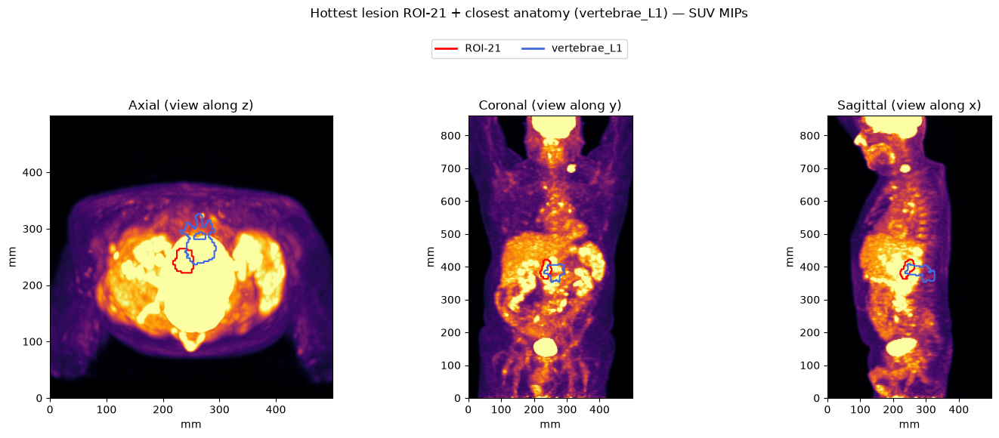

In [14]:
fig = mip_triplet(
    suv_ct, ct_spacing,
    masks={
        hottest_name: (hottest_mask_ct, 'red'),
        closest_anatomy_name: (anatomy_mask_ct, 'royalblue'),
    },
    title=f"Hottest lesion {hottest_name} + closest anatomy ({closest_anatomy_name}) — SUV MIPs",
)
plt.show()

### 6. Axial slice through the hottest lesion and closest anatomy
Visualize axial slice through the hottest lesion and the closest anatomy, with SUV values overlaid on the CT image. This provides a clear view of the spatial relationship between the lesion and the nearby anatomical structure.

In [ ]:
# axial slice through the hottest lesion and closest anatomy, with SUV values overlaid on the CT image

axis-plane = np.argmin(np.abs(ct_affine[2, 3] - lesion_centroid_mm(hottest_name)[2] - ct_affine[2, 2] * np.arange(ct_size[2])))

img = ct_arr[:, :, axis-plane]

# capture in the place where there is no anatomical landmark in the place of the hottest lesion, so that the overlay is more visible
# when there is no anatomical landmark in the place of the hottest lesion, the overlay is more visible, this should not replace the hottest lesion, but it is a good way to visualize the overlay of the hottest lesion and the closest anatomy

# if there are new statistics, we can add them to the plot, but for now we will just plot the hottest lesion and the closest anatomy

# SUV value that could be approperiate for the visual

# plot the CT slice with SUV overlay and lesion/anatomy contours
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.imreadshow(suv_ct[:, :, axis-plane], cmap='hot', alpha=0.5, vmin=0, vmax=np.percentile(suv_ct, 99.5))
plt.contour(hottest_mask_ct[:, :, axis-plane], levels=[0.5], colors=['red'], linewidths=2, label=hottest_name)
plt.contour(anatomy_mask_ct[:, :, axis-plane], levels=[0.5], colors=['blue'], linewidths=2, label=closest_anatomy_name)
plt.title('Axial Slice through Hottest Lesion')
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.colorbar(label='SUV')
plt.show()


## 6. Summary

In [15]:
print(f"Hottest lesion:            {hottest_name}")
print(f"Hottest lesion volume:     {hottest_row['volume_mm3']:.1f} mm^3  ({hottest_row['volume_mm3'] / 1000:.2f} mL)")
print(f"Hottest lesion SUVmax:     {hottest_row['suv_max']:.2f}")
print(f"Closest landmark:          {closest_anatomy_name}")
print(f"Min distance to landmark:  {hottest_row['distance_mm']:.2f} mm")

Hottest lesion:            ROI-21
Hottest lesion volume:     30208.3 mm^3  (30.21 mL)
Hottest lesion SUVmax:     19.32
Closest landmark:          vertebrae_L1
Min distance to landmark:  0.00 mm
